# The Project #
1. This is a project with minimal scaffolding. Expect to use the the discussion forums to gain insights! It’s not cheating to ask others for opinions or perspectives!
2. Be inquisitive, try out new things.
3. Use the previous modules for insights into how to complete the functions! You'll have to combine Pillow, OpenCV, and Pytesseract
4. There are hints provided in Coursera, feel free to explore the hints if needed. Each hint provide progressively more details on how to solve the issue. This project is intended to be comprehensive and difficult if you do it without the hints.

### The Assignment ###
Take a [ZIP file](https://en.wikipedia.org/wiki/Zip_(file_format)) of images and process them, using a [library built into python](https://docs.python.org/3/library/zipfile.html) that you need to learn how to use. A ZIP file takes several different files and compresses them, thus saving space, into one single file. The files in the ZIP file we provide are newspaper images (like you saw in week 3). **Your task is to write python code which allows one to search through the images looking for the occurrences of keywords and faces. E.g. if you search for "pizza" it will return a contact sheet of all of the faces which were located on the newspaper page which mentions "pizza".** This will test your ability to learn a new ([library](https://docs.python.org/3/library/zipfile.html)), your ability to use OpenCV to detect faces, your ability to use tesseract to do optical character recognition, and your ability to use PIL to composite images together into contact sheets.

Each page of the newspapers is saved as a single PNG image in a file called [images.zip](./readonly/images.zip). These newspapers are in english, and contain a variety of stories, advertisements and images. Note: This file is fairly large (~200 MB) and may take some time to work with, I would encourage you to use [small_img.zip](./readonly/small_img.zip) for testing.

Here's an example of the output expected. Using the [small_img.zip](./readonly/small_img.zip) file, if I search for the string "Christopher" I should see the following image:
![Christopher Search](./readonly/small_project.png)
If I were to use the [images.zip](./readonly/images.zip) file and search for "Mark" I should see the following image (note that there are times when there are no faces on a page, but a word is found!):
![Mark Search](./readonly/large_project.png)

Note: That big file can take some time to process - for me it took nearly ten minutes! Use the small one for testing.

## Exploration of the zipfile Library

In [1]:
import zipfile

# The NAME of the module is instructive as it tells us that zipfile - is used to read and write files.
# help(zipfile.__repr__)
# After reading the documentation, we can find out several useful methods
# help(zipfile.PyZipFile) - The Class ZipFile allow us to create ZIP archives with Python Library files and images.
# Then we can find the class ZipFile that allows us to open, read, write, close, list zip files.

help(zipfile.ZipFile)

Help on class ZipFile in module zipfile:

class ZipFile(builtins.object)
 |  ZipFile(file, mode='r', compression=0, allowZip64=True, compresslevel=None)
 |  
 |  Class with methods to open, read, write, close, list zip files.
 |  
 |  z = ZipFile(file, mode="r", compression=ZIP_STORED, allowZip64=True,
 |              compresslevel=None)
 |  
 |  file: Either the path to the file, or a file-like object.
 |        If it is a path, the file will be opened and closed by ZipFile.
 |  mode: The mode can be either read 'r', write 'w', exclusive create 'x',
 |        or append 'a'.
 |  compression: ZIP_STORED (no compression), ZIP_DEFLATED (requires zlib),
 |               ZIP_BZIP2 (requires bz2) or ZIP_LZMA (requires lzma).
 |  allowZip64: if True ZipFile will create files with ZIP64 extensions when
 |              needed, otherwise it will raise an exception when this would
 |              be necessary.
 |  compresslevel: None (default for the given compression type) or an integer
 |      

In [2]:
# After reviewing the zipfile.ZipFile Class

zipfile.ZipFile??

# We find the required parameters

# Init signature:
# zipfile.ZipFile(
#     file,                 # path to the file or file-like object
#     mode='r',             # 'r' read | 'w' write | 'x' exclusively create | 'a' append
#     compression=0,        # ZIP_STORED (no compression) which we'll use, others require third-party librarys 
#     allowZip64=True,      # creates ZIP64 extension when needed
#     compresslevel=None,   # integer - according the compression parameter
# )

In [3]:
print(help(zipfile.ZipFile.read))
print('\n' + '-' * 50 + '\n')
print(help(zipfile.ZipFile.namelist)) # Returns a list of file names in the archive

Help on function read in module zipfile:

read(self, name, pwd=None)
    Return file bytes (as a string) for name.

None

--------------------------------------------------

Help on function namelist in module zipfile:

namelist(self)
    Return a list of file names in the archive.

None


In [4]:
import zipfile

# We then proceed to read the zip file in order to check the comprehension of the zipfile library

test_file = 'readonly/small_img.zip'

img_lst = [] # a list that will contain the files

# Print a list of the files within the zip
with zipfile.ZipFile(test_file) as myzip:
#     print(myzip.namelist())
    for f in myzip.namelist():
        img_lst.append(f)

img_lst

['a-0.png', 'a-1.png', 'a-2.png', 'a-3.png']

In [5]:
# Now that we know the file contents, we will use the extract method to save the files in memory

# zipfile.ZipFile(test_file).extractall() #, members=None, pwd=None)

## Create a test Contact Sheet for the small_img.zip

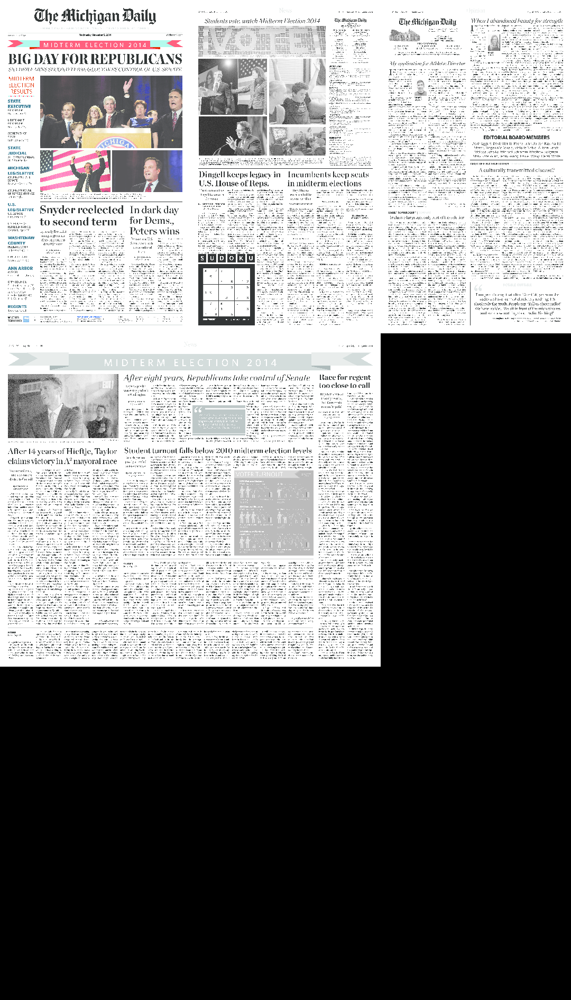

In [6]:
# To check what are the images extracted, we'll loop through the namelist extracted above
import PIL
from PIL import Image
from IPython.display import display

test_contact_sheet = []

for img in img_lst:
    display_image = Image.open(img)
    w = display_image.width
    h = display_image.height
    display_image = display_image.resize((w//10, h//10)) # we resize the image for the sake of visibility
    test_contact_sheet.append(display_image)

# We create a test contact sheet to view a grid of images
first_image=test_contact_sheet[0]
contact_sheet=PIL.Image.new(first_image.mode, (first_image.width*3,first_image.height*3))

x=0
y=0

for img in test_contact_sheet:
    # Lets paste the current image into the contact sheet
    contact_sheet.paste(img, (x, y) )
    # Now we update our X position. If it is going to be the width of the image, then we set it to 0
    # and update Y as well to point to the next "line" of the contact sheet.
    if x+first_image.width == contact_sheet.width:
        x=0
        y=y+first_image.height
    else:
        x=x+first_image.width
        
contact_sheet = contact_sheet.resize((int(contact_sheet.width),int(contact_sheet.height) ))
display(contact_sheet)

## Exploration of the PyTesseract library

Python-tesseract is an optical character recognition (OCR) tool for python. That is, it will recognize and "read" the text embedded in images.

Python-tesseract is a wrapper for [Google's Tesseract-OCR Engine](https://github.com/tesseract-ocr/tesseract). It is also useful as a stand-alone invocation script to tesseract, as it can read all image types supported by the Pillow and Leptonica imaging libraries, including jpeg, png, gif, bmp, tiff, and others. Additionally, if used as a script, Python-tesseract will print the recognized text instead of writing it to a file.



In [7]:
import pytesseract

# Let's explore the pytesseract library
# This library as stated above will allow us to read the text from the newsparer
# thus enabling to create routines that access certain images and the related text

help(pytesseract.pytesseract)

Help on module pytesseract.pytesseract in pytesseract:

NAME
    pytesseract.pytesseract - Python-tesseract. For more information: https://github.com/madmaze/pytesseract

CLASSES
    builtins.OSError(builtins.Exception)
        PandasNotSupported
        TSVNotSupported
        TesseractNotFoundError
    builtins.RuntimeError(builtins.Exception)
        TesseractError
    builtins.object
        Output
    
    class Output(builtins.object)
     |  Data descriptors defined here:
     |  
     |  __dict__
     |      dictionary for instance variables (if defined)
     |  
     |  __weakref__
     |      list of weak references to the object (if defined)
     |  
     |  ----------------------------------------------------------------------
     |  Data and other attributes defined here:
     |  
     |  BYTES = 'bytes'
     |  
     |  DATAFRAME = 'data.frame'
     |  
     |  DICT = 'dict'
     |  
     |  STRING = 'string'
    
    class PandasNotSupported(builtins.OSError)
     |  Ba

In [8]:
# A couple useful methods for this project 

help(pytesseract.pytesseract.image_to_boxes)
print('\n' + '-' * 50 + '\n')
help(pytesseract.pytesseract.image_to_string)

Help on function image_to_boxes in module pytesseract.pytesseract:

image_to_boxes(image, lang=None, config='', nice=0, output_type='string')
    Returns string containing recognized characters and their box boundaries


--------------------------------------------------

Help on function image_to_string in module pytesseract.pytesseract:

image_to_string(image, lang=None, config='', nice=0, output_type='string')
    Returns the result of a Tesseract OCR run on the provided image to string



In [9]:
image = 'a-0.png'

# The following line outputs a string containing the coordinates of the bounding boxes within the image
bound_boxes = pytesseract.image_to_boxes(image) #, lang='en')

In [10]:
image = 'a-0.png'

text = pytesseract.image_to_string(image) #, lang='en')

word_list = []

#let's define a function that removes punctuation
punctuation = ["'", '"', ",", ".", "!", ":", ";", '#', '“','”']
def remove_punctuation(st):
    for idx, char in enumerate(st):
        try:
            if char == '.' and st[idx+1] == 'c': # this skips the punctuation removal if its a .com website
                pass
        except IndexError: # this catches the error if the '.' char is the last character of the string
            pass
            if char in punctuation:
                st = st.replace(char,'')
    return st

# text_copy = text[:]
text = remove_punctuation(text)

for line in text.strip().split('\n'):
    lines = line.split()
    for word in lines:
        word_list.append(word)
        
# correct the words that had hyphenation and got separated
joined_word = ''
for idx, word in enumerate(word_list):
#     print(word, word_list[idx])
    if word[-1] == '-':
        if word.count('-') > 1: # the words has more than 1 hyphen
            joined_word = (word[:-1] + word_list[idx+1])
            del word_list[idx]# deletes both splitted words
            del word_list[idx+1]
            word_list[idx] = joined_word # adds the joined word
        else:
            joined_word = (word + word_list[idx+1]).replace('-','')
            del word_list[idx]# deletes both splitted words
            del word_list[idx+1]
            word_list[idx] = joined_word # adds the joined word
            
word_list

['Che',
 'Michigan',
 'Daily',
 'Ann',
 'Arbor,',
 'Michigan',
 'Wednesday,',
 'November',
 '5,',
 '2014',
 'michigandaily.com',
 'BIG',
 'DAY',
 'FOR',
 'REPUBLICANS',
 'SNYDER',
 'EARNS',
 'SECOND',
 'TERM;',
 'G.O.P.',
 'TAKES',
 'CONTROL',
 'OF',
 'U.S.',
 'SENATE',
 'STATE',
 'EXECUTIVE',
 'GOVERNOR',
 'Rick',
 'Snyder',
 '(R)',
 'LIEUTENANT',
 'GOVERNOR',
 'Brian',
 'Calley',
 '(R)',
 'SECRETARY',
 'OF',
 'STATE',
 'Ruth',
 'Johnson',
 'CR)',
 'STATE',
 'JUDICIAL',
 'ATTORNEY',
 'GENERAL',
 'Bill',
 'Schuette',
 'CR)',
 'MICHIGAN',
 'LEGISLATIVE',
 'MICHIGAN',
 'STATE',
 'SENATE',
 'Rebekah',
 'Warren',
 '(D)',
 'MICHIGAN',
 'HOUSE',
 'OF',
 'REPRESENTATIVES',
 'Jeff',
 'Irwin',
 'CD)',
 'U.S.',
 'LEGISLATIVE',
 'U.S.',
 'SENATE',
 'Gary',
 'Peters',
 '(D)',
 'U.S.',
 'HOUSE',
 'OF',
 'REPRESENTATIVES',
 'Debbie',
 'Dingell',
 '(D)',
 'WASHTENAW',
 'COUNTY',
 'PROBATE',
 'COURT',
 'Julia',
 'Owdziej',
 '(D)',
 'CIRCUIT',
 'COURT',
 'Patrick',
 'Conlin',
 '(D)',
 'ANN',
 'ARBOR',


In [11]:
# Let's refactor the process above into a function

# Let's define a function that removes punctuation
def remove_punctuation(st):
    punctuation = ["'", '"', ",", ".", "!", ":", ";", '#', '“','”']
    for idx, char in enumerate(st):
        if char in punctuation:
            st = st.replace(char,'')     
    return st

def get_words_from_image(image_file):
    word_list = []
    joined_word = ''
        
    text = pytesseract.image_to_string(image_file)
    text = remove_punctuation(text)
    
    for line in text.strip().split('\n'):
        lines = line.split()
        for word in lines:
            word_list.append(word)
    
    for idx, word in enumerate(word_list):
        if word[-1] == '-':
            if word.count('-') > 1: # the words has more than 1 hyphen
                joined_word = (word[:-1] + word_list[idx+1])
                del word_list[idx]# deletes both splitted words
                del word_list[idx+1]
                word_list[idx] = joined_word # adds the joined word
            else:
                joined_word = (word + word_list[idx+1]).replace('-','')
                del word_list[idx]# deletes both splitted words
                del word_list[idx+1]
                word_list[idx] = joined_word # adds the joined word
    return word_list

# The function above allows us to find any word within the newspaper file that we provide.
# We'll use the function in the Final Project Section

In [12]:
get_words_from_image('a-1.png')

['2A',
 '—',
 'Wednesday',
 'November',
 '5',
 '2014',
 'Students',
 'vote',
 'watch',
 'Midterm',
 'Election',
 '2014',
 'The',
 'Michigan',
 'Daily',
 '—',
 'michigandailycom',
 'Che',
 'Michigan',
 'Daily',
 '420',
 'Maynard',
 'St',
 'Ann',
 'Arbor',
 'MI',
 '48109-1327',
 'wwwmichigandailycom',
 'PETER',
 'SHAHIN',
 'DOUGLAS',
 'SOLOMON',
 'Editor',
 'in',
 'Chief',
 'Business',
 'Manager',
 '734-418-4115',
 'ext',
 '1251',
 '734-418-4115',
 'ext',
 '1241',
 'pjshahin@michigandailycom',
 'dougsolo@michigandailycom',
 'Io',
 'pL',
 'Ea',
 'a',
 'a',
 'SE',
 'EAE',
 'A',
 'BR',
 'Re',
 'EC',
 'er',
 'me',
 'GL',
 '~at',
 'Newsroom',
 'News',
 'Tips',
 '734-418-4115',
 'opt3',
 'news@michigandailycom',
 'Corrections',
 'Letters',
 'to',
 'the',
 'Editor',
 'corrections@michigandailycom',
 'tothedaily@michigandailycom',
 'Arts',
 'Section',
 'Editorial',
 'Page',
 'arts@michigandailycom',
 'opinion@michigandailycom',
 'Sports',
 'Section',
 'Photography',
 'Section',
 'beatles',
 'fe)

## Test to detect faces in one newspaper

In [13]:
# drawing.rectangle??

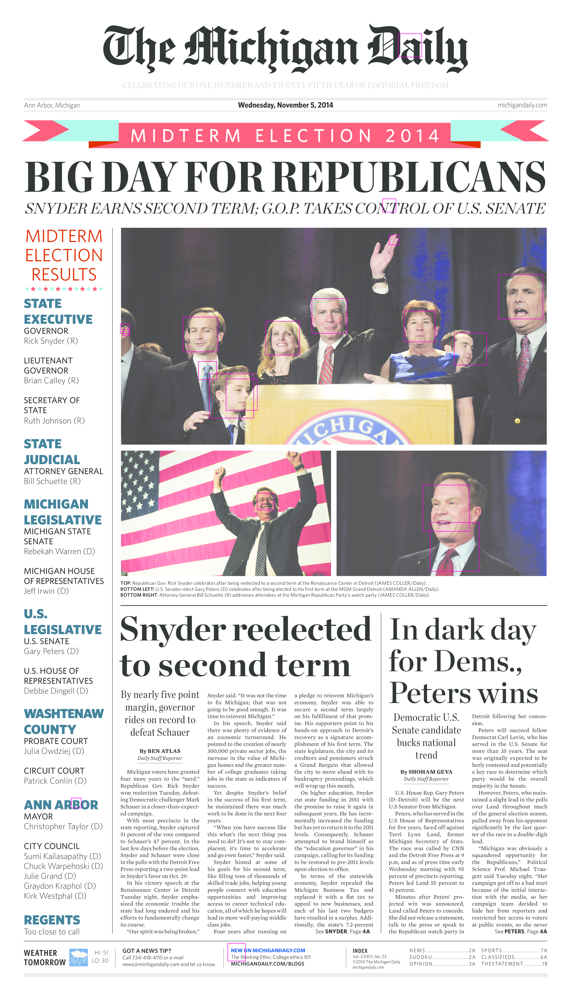

In [14]:
import zipfile
import PIL
from PIL import Image
from PIL import ImageDraw
import pytesseract
import cv2 as cv
import numpy as np


# loading the face detection classifier
face_cascade = cv.CascadeClassifier('readonly/haarcascade_frontalface_default.xml')

pil_img=Image.open('a-0.png')
open_cv_version=pil_img.convert("L") # Convert image to greyscale for opencv, and get the bytestream
open_cv_version.save('a-0.png') # Write that to a file

cv_img = cv.imread('a-0.png')
faces = face_cascade.detectMultiScale(cv_img)

pil_img = pil_img.convert("RGB") # Convert image to RGB mode
drawing=ImageDraw.Draw(pil_img)
# And iterate through the faces sequence, tuple unpacking as we go
for x,y,w,h in faces:
    # And remember this is width and height so we have to add those appropriately.
    drawing.rectangle((x,y,x+w,y+h), outline=(255,0,230), width=3)
display(pil_img)

# As we find out, it is detecting more faces than we would expect, so we will try a different approach.

In [15]:
# Lets define a function which will plot rectanges for us over the image
def show_rects(faces, file):
    pil_img=Image.open(file).convert("RGB")
    # Set our drawing context
    drawing=ImageDraw.Draw(pil_img)
    # And plot all of the rectangles in faces
    for x,y,w,h in faces:
        drawing.rectangle((x,y,x+w,y+h), outline=(255,0,230), width=4)
    #Finally lets display this
    display(pil_img)
    
# Let's define a function that let's us set the scale factor and the image
# And then by invoking show_rects function, draws the squares on the faces
def detect_faces(image_list, scale_factor):
    """
    The scale factor changes the size of rectangles which are
    considered against the model, that is, the haarcascades XML file. You can think of it as if
    it were changing the size of the rectangles which are on the screen.
    """
    
    for file in image_list:
        cv_img = cv.imread(file)
        faces = face_cascade.detectMultiScale(cv_img, scale_factor) # set the scale factor 
        show_rects(faces, file)

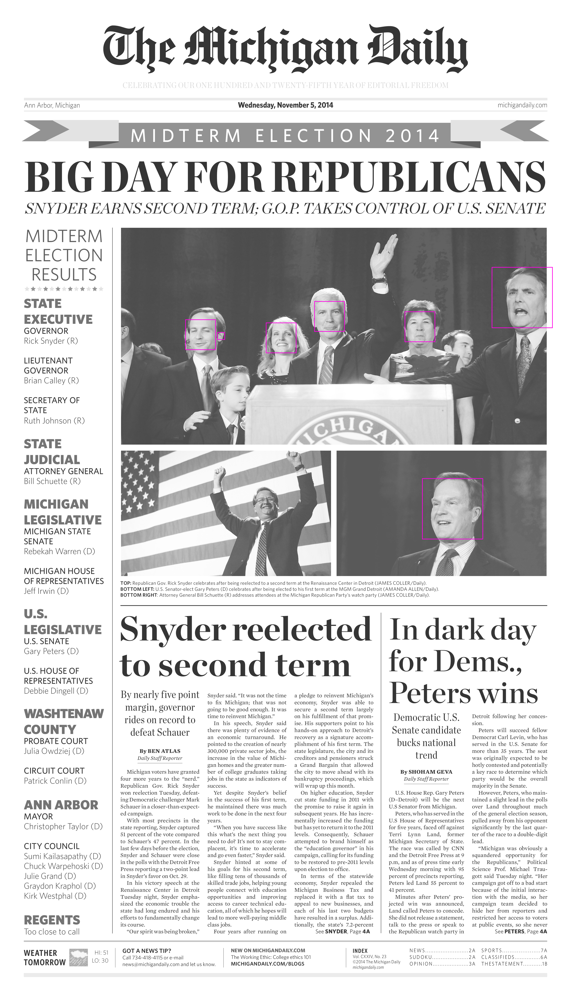

In [16]:
image_list = ['a-0.png'] # The list of images we'll be unzipping
scale_factor = 2 # We can experiment with the scale factor. Usually it's a small value, lets try 1.05

# After iterating with several values, 
# we found out the scale_factor = 2 to yield best results but only for the file 'a-0.png'
# We will search a way for recognition pattern to work on all images as well as the text
detect_faces(image_list, scale_factor)

-------------------------

## Finall Project

The code below allows us to search through the images looking for the occurrences of keywords and faces

E.g. if you search for "pizza", it will return a contact sheet of all of the faces which were located on the newspaper page which mentions "pizza".

In [37]:
import zipfile
import PIL
from PIL import Image
from PIL import ImageDraw
import pytesseract
import cv2 as cv
import numpy as np

# loading the face detection classifier
face_cascade = cv.CascadeClassifier('readonly/haarcascade_frontalface_default.xml')

d_images = {} # Dictionary with filenames as keys and PIL.Image objects as values
img_lst = [] # a list that will contain the files

# Let's streamline the unzipping process by creating a function
# It takes the zip file as parameter
def unzip_images(zip_file):
    '''
    We use the Zipfile library to open the zipfile 
    zip_file is the route to the .zip file
    then iterate through the objects (newspapers) in the zipfile using .infolist().
    Then create a dictionary d_files with filenames as keys
    and we use PIL.Image.open() to store the file-like objects
    '''
    file = zipfile.ZipFile(zip_file)
    for f in file.infolist():
        d_images[f.filename] = [Image.open(file.open(f.filename))]
        img_lst.append(f.filename)
        
unzip_images('readonly/images.zip')
# d_images

# Let's define a function that removes punctuation
def remove_punctuation(st):
    punctuation = ["'", '"', ",", ".", "!", ":", ";", '#', '“','”']
    for idx, char in enumerate(st):
        if char in punctuation:
            st = st.replace(char,'')     
    return st

def get_words_from_image(image_file):
    word_list = []
    joined_word = ''
        
    text = pytesseract.image_to_string(image_file)
    text = remove_punctuation(text)
    
    for line in text.strip().split('\n'):
        lines = line.split()
        for word in lines:
            word_list.append(word)
    
    for idx, word in enumerate(word_list):
        if word[-1] == '-':
            if word.count('-') > 1: # the words has more than 1 hyphen
                joined_word = (word[:-1] + word_list[idx+1])
                del word_list[idx]# deletes both split words
                del word_list[idx+1]
                word_list[idx] = joined_word # adds the joined word
            else:
                joined_word = (word + word_list[idx+1]).replace('-','')
                del word_list[idx]# deletes both split words
                del word_list[idx+1]
                word_list[idx] = joined_word # adds the joined word
    word_string = ' '.join(word_list) # joins the list into a string
    return word_string

# ask for user input
def clean_query(query):
    '''
    Returns only the first word of the input
    '''
    clean = remove_punctuation(query).strip().split()[0]#.lower()
    return clean

def detect_faces(img, scale_factor):
    '''
    Function to detect faces on images
    '''
    faces = (face_cascade.detectMultiScale(np.array(img),1.35,4)).tolist()
    return faces

# Refer to the dict and list objects on lines 12, 13

# A list that links all the extracted words with the image
# :params:
# query - user input
# d_images = {} # Dictionary with filenames as keys and PIL.Image objects as values
# img_lst = [] # a list that will contain the files
    
for file in img_lst:
    img = d_images[file][0]

    d_images[file].append(get_words_from_image(img))

## QUERIES TEST

Enter a word: pizza
Results found in File a-2.png


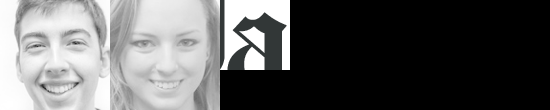

Word pizza not found in any other file...


In [52]:
# Let's try with pizza
query = clean_query(input('Enter a word: '))


for file in img_lst:
    img = d_images[file][0]

    if query in d_images[file][1]: 
        print('Results found in File',file)

        try:
            # We insert different Scale Factor test, and test minNeighbors – 4
            #  faces = detect_faces(img) # invoke the function detect faces
            
            faces = (face_cascade.detectMultiScale(np.array(img),1.35,4)).tolist()
            d_images[file].append(faces)

            faces_in_file = []

            for x,y,w,h in d_images[file][2]:
                faces_in_file.append(img.crop((x,y,x+w,y+h))) # crops the faces of the corresponding image


            first_image = faces_in_file[0]
            contact_sheet = PIL.Image.new(first_image.mode, (550, 110 * int(np.ceil(len(faces_in_file) / 5))))

            # Sort the images by biggest size
            def get_volume(face):
                return face.width * face.height

            faces_in_file = sorted(faces_in_file, key=get_volume, reverse=True)

            x = 0
            y = 0

            for face in faces_in_file:
                face.thumbnail( (110, 110) )
                contact_sheet.paste(face, (x, y))

                if x + 110 == contact_sheet.width:
                    x = 0
                    y = y + 110
                else:
                    x = x + 110

            display(contact_sheet)
        except Exception as e:
            print('But there were no faces in that file!')
print(f'Word {query} not found in any other file...')

# # RESULTS MAY BE DIFFERENT FROM THE EXAMPLE BECAUSE WE ARE SORTING BY THE SIZES OF THE FACES

Enter a word: Mark
Results found in File a-0.png


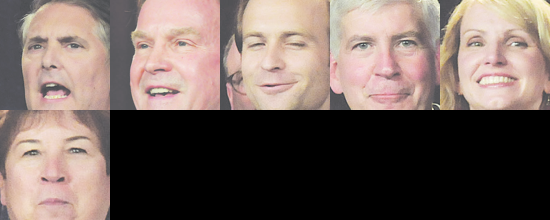

Results found in File a-1.png


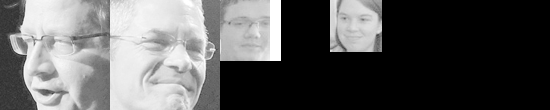

Results found in File a-10.png
But there were no faces in that file!
Results found in File a-13.png


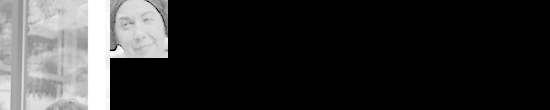

Results found in File a-2.png


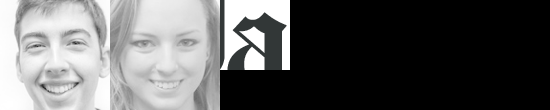

Results found in File a-3.png


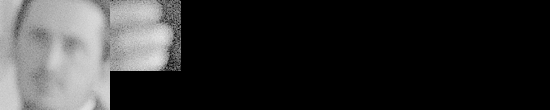

Results found in File a-8.png
But there were no faces in that file!
Word Mark not found in any other file...


In [53]:
# Let's try with Mark
query = clean_query(input('Enter a word: '))


for file in img_lst:
    img = d_images[file][0]

    if query in d_images[file][1]: 
        print('Results found in File',file)

        try:
            # We insert different Scale Factor test, and test minNeighbors – 4
            #  faces = detect_faces(img) # invoke the function detect faces
            
            faces = (face_cascade.detectMultiScale(np.array(img),1.35,4)).tolist()
            d_images[file].append(faces)

            faces_in_file = []

            for x,y,w,h in d_images[file][2]:
                faces_in_file.append(img.crop((x,y,x+w,y+h))) # crops the faces of the corresponding image


            first_image = faces_in_file[0]
            contact_sheet = PIL.Image.new(first_image.mode, (550, 110 * int(np.ceil(len(faces_in_file) / 5))))

            # Sort the images by biggest size
            def get_volume(face):
                return face.width * face.height

            faces_in_file = sorted(faces_in_file, key=get_volume, reverse=True)

            x = 0
            y = 0

            for face in faces_in_file:
                face.thumbnail( (110, 110) )
                contact_sheet.paste(face, (x, y))

                if x + 110 == contact_sheet.width:
                    x = 0
                    y = y + 110
                else:
                    x = x + 110

            display(contact_sheet)
        except Exception as e:
            print('But there were no faces in that file!')
print(f'Word {query} not found in any other file...')

# # RESULTS MAY BE DIFFERENT FROM THE EXAMPLE BECAUSE WE ARE SORTING BY THE SIZES OF THE FACES

Enter a word: Christopher
Results found in File a-0.png


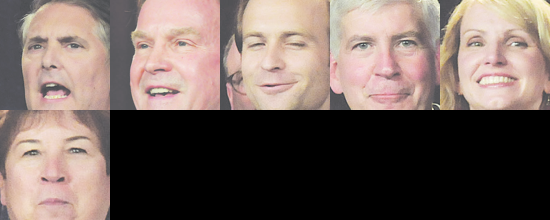

Results found in File a-3.png


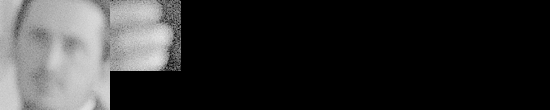

Word Christopher not found in any other file...


In [54]:
# Let's try with Christopher
query = clean_query(input('Enter a word: '))


for file in img_lst:
    img = d_images[file][0]

    if query in d_images[file][1]: 
        print('Results found in File',file)

        try:
            # We insert different Scale Factor test, and test minNeighbors – 4
            #  faces = detect_faces(img) # invoke the function detect faces
            
            faces = (face_cascade.detectMultiScale(np.array(img),1.35,4)).tolist()
            d_images[file].append(faces)

            faces_in_file = []

            for x,y,w,h in d_images[file][2]:
                faces_in_file.append(img.crop((x,y,x+w,y+h))) # crops the faces of the corresponding image


            first_image = faces_in_file[0]
            contact_sheet = PIL.Image.new(first_image.mode, (550, 110 * int(np.ceil(len(faces_in_file) / 5))))

            # Sort the images by biggest size
            def get_volume(face):
                return face.width * face.height

            faces_in_file = sorted(faces_in_file, key=get_volume, reverse=True)

            x = 0
            y = 0

            for face in faces_in_file:
                face.thumbnail( (110, 110) )
                contact_sheet.paste(face, (x, y))

                if x + 110 == contact_sheet.width:
                    x = 0
                    y = y + 110
                else:
                    x = x + 110

            display(contact_sheet)
        except Exception as e:
            print('But there were no faces in that file!')
print(f'Word {query} not found in any other file...')

# # RESULTS MAY BE DIFFERENT FROM THE EXAMPLE BECAUSE WE ARE SORTING BY THE SIZES OF THE FACES